CONTINUACAO DO CURSO

In [ ]:
!pip install tensorflow

In [1]:
# bibliotecas utilizadas
import cv2 #OpenCV
from google.colab.patches import cv2_imshow
from google.colab import drive
import dlib
from PIL import Image
import numpy as np
import zipfile
from sklearn.metrics import accuracy_score
import os
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense, UpSampling2D, Reshape
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Input, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from keras.models import save_model
import sys
import skimage.io
tf.__version__ #versao do tensorflow

'2.17.0'

In [ ]:
#caso de problema com a versao do tensorflow
#!pip install tensorflow == 2.6.0 #versao usada no curso

In [ ]:
# drive
drive.mount('/content/drive')

Mounted at /content/drive


# Projeto 18 - Transferencia de estilo

Enviar duas imagens para a rede neural e combina ambas as imagens



---



> A base da rede neural eh a ImageNet.

> Nao se usa a parte densa da rede neural, pois nao buscamos a classificao

> O objetivo eh trabalhar nas camdas de convolucao e aproveitar dos valores dos pesos nas funcoes de ativacao

> A uma diferenca entre estilo (imagem adicionada) e conteudo (imagem original).

## Carregar a rede neural

In [ ]:
rn = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
#o include_top = False é para nao puxar a parte densa da rede

In [ ]:
rn.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [ ]:
len(rn.layers) #quantidade de camadas

22

## Carregar imagens para uso

**A imagem que receberá o estilo**


---



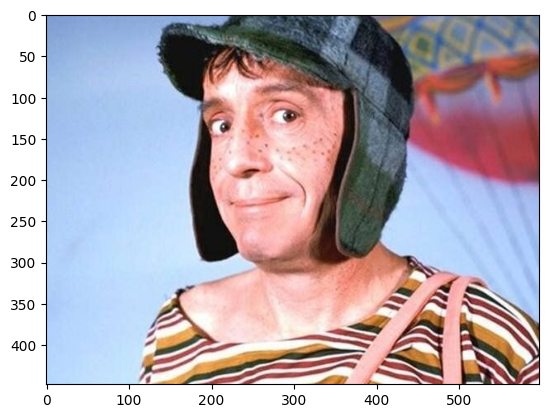

In [ ]:
imagem_conteudo = tf.keras.preprocessing.image.load_img('/content/drive/MyDrive/Visão Computacional Guia Completo/Images/chaves.jpeg')
plt.imshow(imagem_conteudo)

In [ ]:
type(imagem_conteudo)

PIL.JpegImagePlugin.JpegImageFile

In [ ]:
#conversao para numpy
imagem_conteudo = tf.keras.preprocessing.image.img_to_array(imagem_conteudo)

In [ ]:
type(imagem_conteudo)

numpy.ndarray

In [ ]:
imagem_conteudo.shape

(448, 598, 3)

In [ ]:
imagem_conteudo.min(), imagem_conteudo.max()

(0.0, 255.0)

In [ ]:
#normalização em 0 e 1
imagem_conteudo = imagem_conteudo / 255

In [ ]:
imagem_conteudo.min(), imagem_conteudo.max()

(0.0, 1.0)

In [ ]:
#atualização do batch
imagem_conteudo = imagem_conteudo[tf.newaxis,:]
imagem_conteudo.shape

(1, 448, 598, 3)

**A imagem que será o estilo**


---

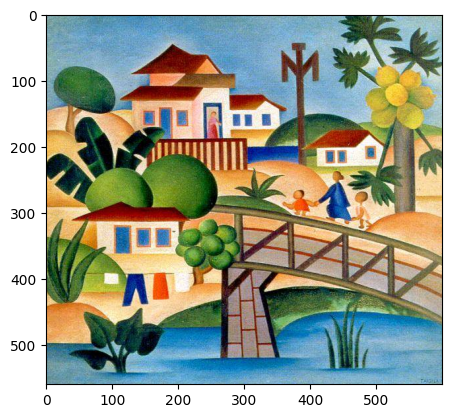

In [ ]:
imagem_estilo = tf.keras.preprocessing.image.load_img('/content/drive/MyDrive/Visão Computacional Guia Completo/Images/tarsila_amaral.jpg')
plt.imshow(imagem_estilo)

In [ ]:
imagem_estilo = tf.keras.preprocessing.image.img_to_array(imagem_estilo)
imagem_estilo = imagem_estilo / 255
imagem_estilo = imagem_estilo[tf.newaxis,:]
imagem_estilo.shape

(1, 560, 600, 3)

In [ ]:
imagem_conteudo.shape

(1, 448, 598, 3)

Uma boa pratica nessa técnica é usar imagens com dimensões parecidas

## Contrução da rede neural

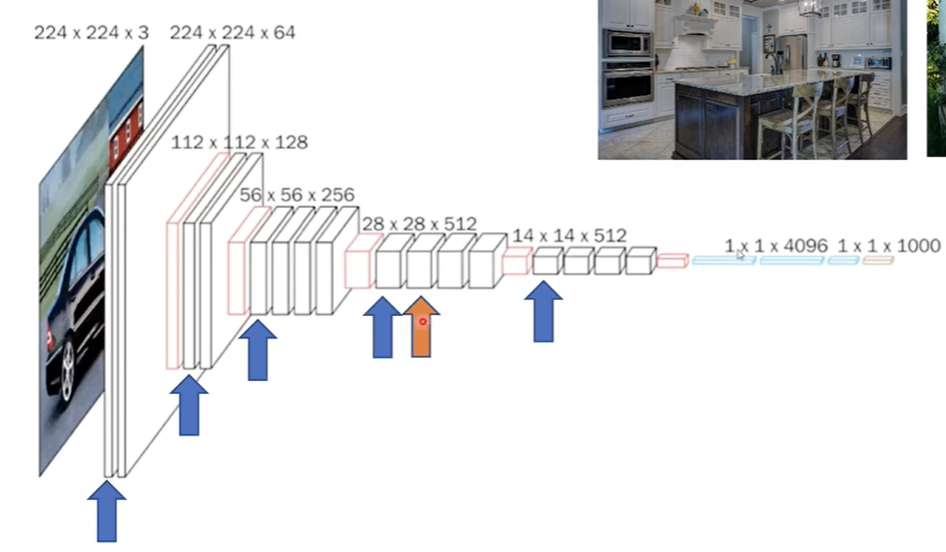

> São 5 camadas de estilo

> E 1 camada para o conteudo da imagem

In [ ]:
#buscar os nomes no summary
camadas_conteudo = ['block4_conv2']
camadas_estilo = ['block1_conv1','block2_conv1','block3_conv1','block4_conv1','block5_conv1']

In [ ]:
numero_camadas_conteudo = len(camadas_conteudo)
numero_camadas_estilo = len(camadas_estilo)
print(numero_camadas_conteudo, numero_camadas_estilo)

1 5


In [ ]:
def vgg_camadas(nome_camadas):
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False #congelar os pesos
  outputs = [vgg.get_layer(nome).output for nome in nome_camadas] #receber os valores de ativação de cada uma das camadas
  rn1 = tf.keras.Model(inputs = [vgg.input], outputs = outputs) #recriando a estrutura
  return rn1

In [ ]:
extrator_estilo = vgg_camadas(camadas_estilo)
extrator_conteudo = vgg_camadas(camadas_conteudo)

In [ ]:
extrator_estilo.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [ ]:
extrator_estilo.outputs

[<KerasTensor: shape=(None, None, None, 64) dtype=float32 (created by layer 'block1_conv1')>,
 <KerasTensor: shape=(None, None, None, 128) dtype=float32 (created by layer 'block2_conv1')>,
 <KerasTensor: shape=(None, None, None, 256) dtype=float32 (created by layer 'block3_conv1')>,
 <KerasTensor: shape=(None, None, None, 512) dtype=float32 (created by layer 'block4_conv1')>,
 <KerasTensor: shape=(None, None, None, 512) dtype=float32 (created by layer 'block5_conv1')>]

In [ ]:
saidas_estilo = extrator_estilo(imagem_estilo)
# a imagem de estilo é passada pela estrutra da rede neural acima e retorna vários outputs como o acima.

In [ ]:
len(saidas_estilo)

5

In [ ]:
saidas_estilo[0] #valores de função de ativação

<tf.Tensor: shape=(1, 560, 600, 64), dtype=float32, numpy=
array([[[[0.0000000e+00, 1.0877684e-01, 6.1876804e-02, ...,
          4.7548777e-01, 4.9462211e-01, 1.5644577e-01],
         [0.0000000e+00, 2.0908591e-01, 3.7850654e-01, ...,
          1.7786789e-01, 1.4868840e+00, 1.1423519e+00],
         [0.0000000e+00, 2.0027554e-01, 3.8594386e-01, ...,
          1.3720292e-01, 1.5296973e+00, 1.1784816e+00],
         ...,
         [0.0000000e+00, 3.3374473e-01, 5.1606625e-01, ...,
          0.0000000e+00, 1.6996144e+00, 1.3344206e+00],
         [0.0000000e+00, 3.4465256e-01, 5.2247041e-01, ...,
          0.0000000e+00, 1.7055957e+00, 1.3397942e+00],
         [7.8262198e-01, 4.2381793e-01, 7.7576435e-01, ...,
          4.4776672e-01, 2.4687252e+00, 2.3798752e+00]],

        [[0.0000000e+00, 1.1056373e-01, 0.0000000e+00, ...,
          8.2489133e-02, 0.0000000e+00, 0.0000000e+00],
         [6.3421273e-01, 2.3642045e-01, 3.5782573e-01, ...,
          0.0000000e+00, 5.8060557e-01, 7.0158607e-01

In [ ]:
saidas_estilo[0].shape #64 valores assim como o primeiro output da rede

TensorShape([1, 560, 600, 64])

In [ ]:
for x in range(5):
  print(saidas_estilo[x].shape)

(1, 560, 600, 64)
(1, 280, 300, 128)
(1, 140, 150, 256)
(1, 70, 75, 512)
(1, 35, 37, 512)


In [ ]:
def gram_matriz(ativacoes): #calculo para representação do estilo de uma imagem de entrada. É usado um espaço de caracteríticas extraidos dos valores dos filtros.
  resultado = tf.linalg.einsum('bijc,bijd->bcd', ativacoes, ativacoes) #codificações do TF para multiplicação de matrizes
  input_shape = tf.shape(ativacoes) #extrair dimensoes
  num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32) #transformação
  return resultado / num_locations

# a ideia é reduizr a dimensionalidade, extraindo as informações mais importantes

In [ ]:
saidas_estilo[0].shape

TensorShape([1, 560, 600, 64])

In [ ]:
gram_matriz(saidas_estilo[0])

<tf.Tensor: shape=(1, 64, 64), dtype=float32, numpy=
array([[[0.63098735, 0.28931642, 0.2851602 , ..., 0.10537568,
         0.369587  , 0.45012608],
        [0.28931642, 0.24121156, 0.18381073, ..., 0.03157694,
         0.19594139, 0.21715762],
        [0.2851602 , 0.18381073, 0.16743274, ..., 0.02779872,
         0.19410352, 0.22709455],
        ...,
        [0.10537568, 0.03157694, 0.02779872, ..., 0.08297461,
         0.06948002, 0.06642947],
        [0.369587  , 0.19594139, 0.19410352, ..., 0.06948002,
         0.28682625, 0.3185408 ],
        [0.45012608, 0.21715762, 0.22709455, ..., 0.06642947,
         0.3185408 , 0.37468514]]], dtype=float32)>

In [ ]:
class StyleContentModel(tf.keras.models.Model): # .Model vai trazer todas as caracteristicas da RN
  def __init__(self, camadas_estilo, camadas_conteudo):
    super().__init__()
    self.vgg = vgg_camadas(camadas_estilo + camadas_conteudo)
    self.camadas_estilo = camadas_estilo
    self.camadas_conteudo = camadas_conteudo
    self.numero_camadas_estilo = len(camadas_estilo)
    self.vgg.trainable = False #congelar os pesos

  def call(self, imagem):
    imagem = imagem * 255.0 # estava em escala 0 e 1
    imagem_preprocessada = tf.keras.applications.vgg19.preprocess_input(imagem) # normailização do vgg de -127 a 127
    outputs = self.vgg(imagem_preprocessada)
    saidas_estilo = outputs[:self.numero_camadas_estilo]
    saidas_conteudo = outputs[self.numero_camadas_estilo:]

    saidas_estilo = [gram_matriz(camada) for camada in saidas_estilo] #somente para camadas de estilo

    estilo_dict = {nome_estilo: valor for nome_estilo, valor in zip(self.camadas_estilo, saidas_estilo)} #dicionario com o nome da camadas e os valores dps da apicação da gram_matriz
    conteudo_dict = {nome_conteudo: valor for nome_conteudo, valor in zip(self.camadas_conteudo, saidas_conteudo)} #sem aplicação da gram_matriz

    return {'conteudo':conteudo_dict, 'estilo': estilo_dict}

In [ ]:
#teste com a classe

extrator = StyleContentModel(camadas_estilo, camadas_conteudo)

In [ ]:
resultados = extrator(imagem_conteudo)

In [ ]:
resultados

{'conteudo': {'block4_conv2': <tf.Tensor: shape=(1, 56, 74, 512), dtype=float32, numpy=
  array([[[[  17.335257,    0.      ,    0.      , ...,  574.69464 ,
               0.      ,    0.      ],
           [   0.      ,    0.      ,    0.      , ...,  291.73862 ,
             132.49077 ,    0.      ],
           [   0.      ,    0.      ,    0.      , ...,  333.45657 ,
             117.71992 ,    0.      ],
           ...,
           [ 692.7539  ,    0.      ,    0.      , ..., 1512.0807  ,
              10.164075,  321.67056 ],
           [ 139.49515 ,    0.      ,    0.      , ..., 1108.5737  ,
             102.29349 ,  179.42451 ],
           [ 152.06622 ,    0.      ,    0.      , ...,  471.31982 ,
             179.42244 ,  671.04755 ]],
  
          [[   0.      ,    0.      ,    0.      , ...,  548.79645 ,
               0.      ,    0.      ],
           [   0.      ,    0.      ,    0.      , ...,   43.473793,
               0.      ,    0.      ],
           [   0.      ,    

In [ ]:
for chave, valor in resultados.items():
  print(chave, valor.keys())


# dentro da chave conteudo tem os valores de ativação da camada de conteudo
# dentro da chave estilo tem 5 valores, em cada um delas tem-se o resultado da gram_matriz

conteudo dict_keys(['block4_conv2'])
estilo dict_keys(['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1'])


In [ ]:
estilo_objetivo = extrator(imagem_estilo)['estilo']
conteudo_objetivo = extrator(imagem_conteudo)['conteudo']

In [ ]:
len(estilo_objetivo), len(conteudo_objetivo)

(5, 1)

In [ ]:
nova_imagem = tf.Variable(imagem_conteudo)  #colocar estilo na camada de conteudo

In [ ]:
peso_conteudo = 1
peso_estilo = 100 # 100 unidades de estilo para cada unidade de conteudo

In [ ]:
optimizer = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1) #otimizador para treinamento

## Treinamento

Epoca:  500  Conteudo loss:  tf.Tensor(685795.0, shape=(), dtype=float32)  Estilo loss:  tf.Tensor(159485520.0, shape=(), dtype=float32)  Total loss:  tf.Tensor(3190396200.0, shape=(), dtype=float32)


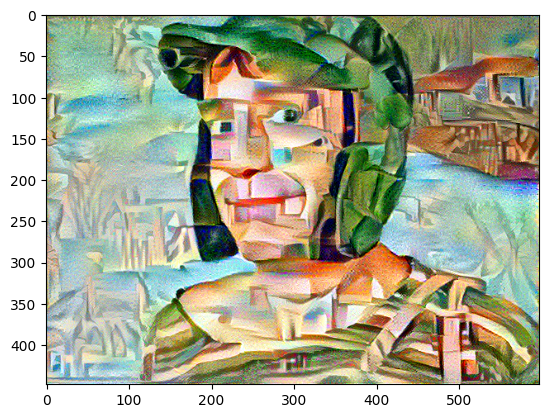



Epoca:  1000  Conteudo loss:  tf.Tensor(711273.06, shape=(), dtype=float32)  Estilo loss:  tf.Tensor(70533510.0, shape=(), dtype=float32)  Total loss:  tf.Tensor(1411381600.0, shape=(), dtype=float32)


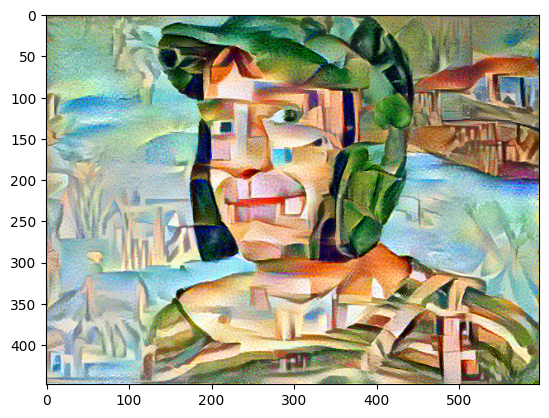



Epoca:  1500  Conteudo loss:  tf.Tensor(723226.7, shape=(), dtype=float32)  Estilo loss:  tf.Tensor(50306336.0, shape=(), dtype=float32)  Total loss:  tf.Tensor(1006849900.0, shape=(), dtype=float32)


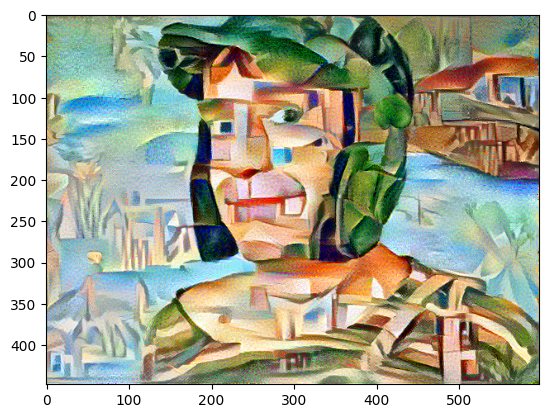



Epoca:  2000  Conteudo loss:  tf.Tensor(732011.56, shape=(), dtype=float32)  Estilo loss:  tf.Tensor(40074692.0, shape=(), dtype=float32)  Total loss:  tf.Tensor(802225900.0, shape=(), dtype=float32)


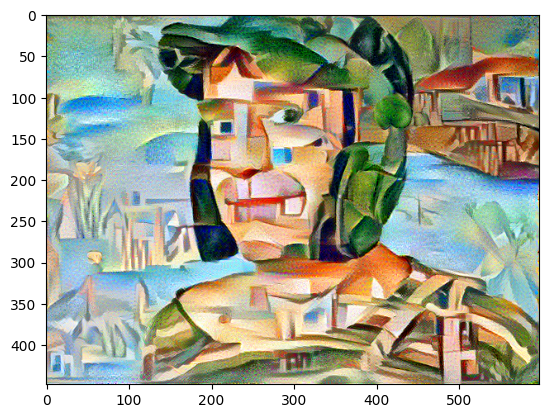



Epoca:  2500  Conteudo loss:  tf.Tensor(739008.75, shape=(), dtype=float32)  Estilo loss:  tf.Tensor(33489948.0, shape=(), dtype=float32)  Total loss:  tf.Tensor(670538000.0, shape=(), dtype=float32)


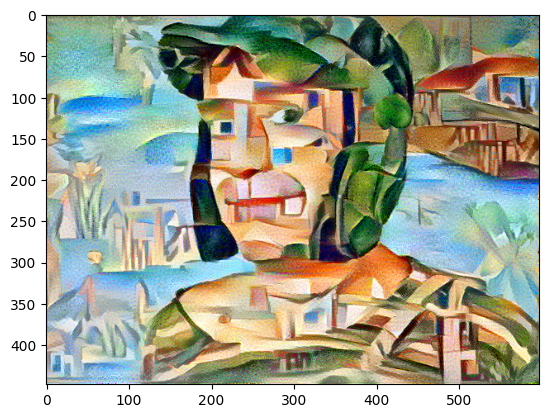



Epoca:  3000  Conteudo loss:  tf.Tensor(745267.8, shape=(), dtype=float32)  Estilo loss:  tf.Tensor(28851676.0, shape=(), dtype=float32)  Total loss:  tf.Tensor(577778800.0, shape=(), dtype=float32)


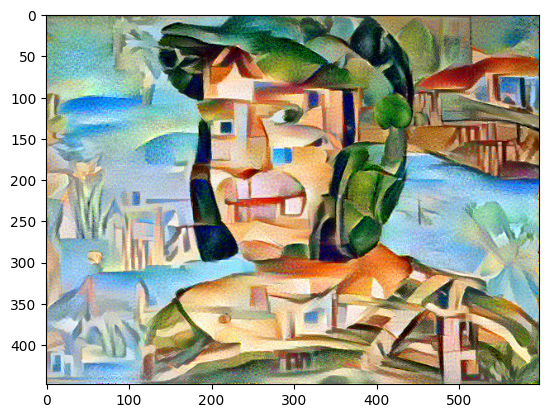

In [ ]:
epocas = 3000
impressao = 500 #mostrar resultado a cada 500 epocas

for epoca in range(epocas):
  with tf.GradientTape() as tape:
    outputs = extrator(nova_imagem)

    saidas_conteudo = outputs['conteudo']
    saidas_estilo = outputs['estilo']

    conteudo_loss =  tf.add_n([tf.reduce_mean((saidas_conteudo[nome] - conteudo_objetivo[nome])**2) for nome in saidas_conteudo.keys()])#avaliar o quanto de conteudo estamos perdendo
    estilo_loss = tf.add_n([tf.reduce_mean((saidas_estilo[nome] - estilo_objetivo[nome])**2) for nome in saidas_estilo.keys()]) #avaliar o quanto de estilo estamos perdendo

    total_loss = (conteudo_loss*peso_conteudo/numero_camadas_conteudo) + (estilo_loss*peso_estilo/numero_camadas_estilo)

  gradiente = tape.gradient(total_loss, nova_imagem) #calcular a perda total de conteudo e estilo em relação a cada pixel
  optimizer.apply_gradients([(gradiente, nova_imagem)]) #mudar os pixels e att a imagem
  nova_imagem.assign(tf.clip_by_value(nova_imagem, 0.0,1.0)) #voltar para a normalização original entre 0 e 1

  if (epoca+1) % impressao==0:
    print('Epoca: ', epoca+1, ' Conteudo loss: ', conteudo_loss, ' Estilo loss: ', estilo_loss,' Total loss: ', total_loss)
    plt.imshow(tf.squeeze(nova_imagem, axis=0));
    plt.show()
    print('\n')


>Note que a loss do conteudo vai aumentando, ou seja, estou perdendo partes da minha imagem original, enquanto a loss do estilo vai abaixando, o que significa que estou incorporando mais estilo para a imagem original.

## Vizualizar resultados

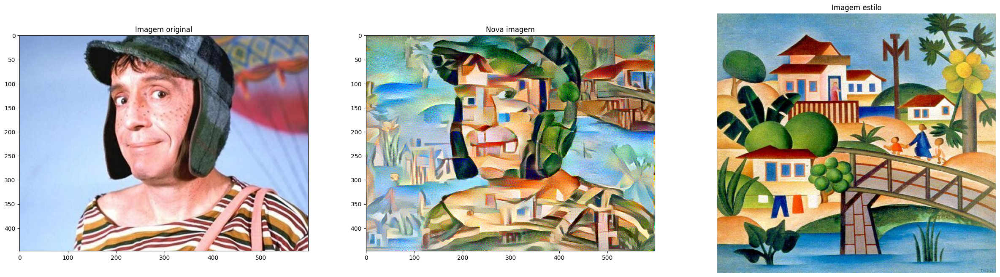

In [ ]:
figura, (eixo1, eixo2, eixo3) = plt.subplots(1,3, figsize=(30,8))
eixo1.imshow(tf.squeeze(imagem_conteudo, axis=0))
eixo1.set_title('Imagem original')
plt.axis('off');

eixo2.imshow(tf.squeeze(nova_imagem, axis=0))
eixo2.set_title('Nova imagem')
plt.axis('off');

eixo3.imshow(tf.squeeze(imagem_estilo, axis=0))
eixo3.set_title('Imagem estilo')
plt.axis('off');

# Projeto 19 - GANs

> GANs são Redes Adversarias Generativas

> a diferença é que serão duas redes para gerar os resultados e nao apenas uma

> demanda um alto poder computacional para treinamento

> Esse projeto focará em criar numeros digitados a mão

> A GAN é um técnica utilizada para geração de imagens automaticas

> possui 2 componentes: Gerador (cria a imagem) e um Discriminador (confere se as geradas se parecem com as originais)

> Ambos começam do zero e precisam aprender sozinhos, tanto a gerar quanto avaliar.

> cada um desses componentes são uma rede diferente.

> Gerador recebe apenas vetores aleatórios e vai criando imagens a partir disso a cada rodada.

> O Discriminador recebe como parametros imagens alvo e aprende a reconhecer o padrao dessas imagens. Essa rede tambem recebe imagens não alvo, sendo uma classificação binária.

> As redes podem ser densas, convolucionais ou ambas.

> **Antes do treinamento:**

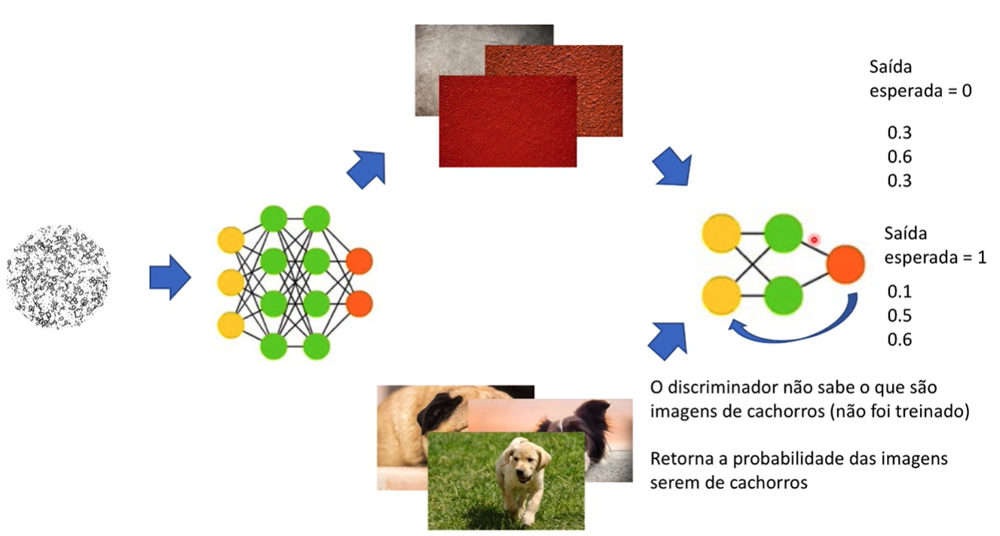

> Depois da primeira rodada de treinamento e envio de feedback de uma para outra para correção dos pesos.

> Dessa forma o discriminante conversa com o gerador para correção dos erros a cada epoca de treinamento até começar a acertar.

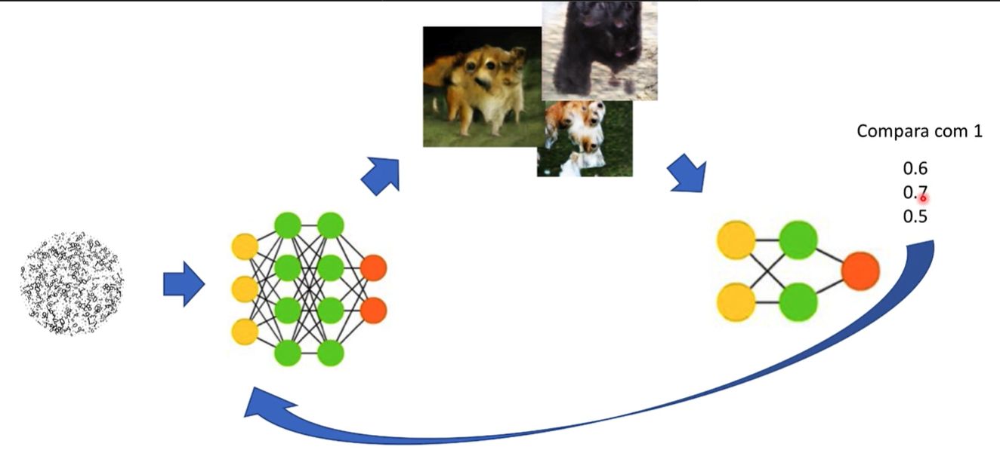

## Implementação

In [ ]:
(X_train, y_train), (_,_) =  tf.keras.datasets.mnist.load_data()#nao é necessario carregar as imagens de teste

In [ ]:
X_train.shape #escalas de cinza

(60000, 28, 28)

In [ ]:
y_train.shape

(60000,)

3


<function matplotlib.pyplot.show(close=None, block=None)>

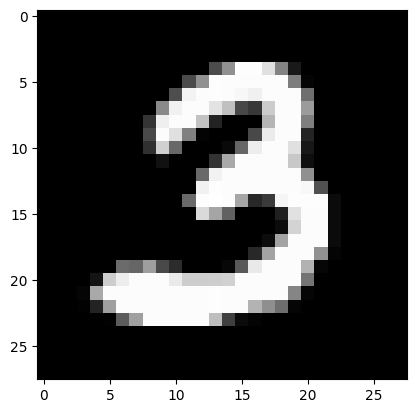

In [ ]:
i = np.random.randint(0, X_train.shape[0])
print(y_train[i])
plt.imshow(X_train[i], cmap='gray');
plt.show

In [ ]:
#precisamos redefinir o shape e adicionar o canal
X_train = X_train.reshape(X_train.shape[0], 28, 28, 1).astype('float32')
X_train.shape

(60000, 28, 28, 1)

In [ ]:
X_train[0].min(), X_train[0].max()

(0.0, 255.0)

In [ ]:
#normalização
#X_train = X_train/255 #seria o ideal, porem para GANs é diferente, tem que ser entre -1 e 1
X_train = (X_train - 127.5)/127.5

In [ ]:
X_train[0].min(), X_train[0].max()

(-1.0, 1.0)

In [ ]:
buffer_size = 60000
batch_size = 256

In [ ]:
buffer_size/batch_size

234.375

In [ ]:
type(X_train) #tem que ser BatchDataset

numpy.ndarray

In [ ]:
X_train = tf.data.Dataset.from_tensor_slices(X_train).shuffle(buffer_size).batch(batch_size) #variavél no formato do TF

In [ ]:
type(X_train)

tensorflow.python.data.ops.batch_op._BatchDataset

In [ ]:
X_train

<_BatchDataset element_spec=TensorSpec(shape=(None, 28, 28, 1), dtype=tf.float32, name=None)>

## Contruir Gerador

In [ ]:
#contruir a arquitetura do gerador

def cria_gerador():
  network = tf.keras.Sequential()
  network.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,))) #entra 100 -> 12544 na camada oculta
  network.add(layers.BatchNormalization())
  network.add(layers.LeakyReLU()) #leaky relu nao zera os valores negativos

  #camada para converte de matriz para tensor
  network.add(layers.Reshape((7,7,256)))


  #conversao para 7x7x128
  network.add(layers.Conv2DTranspose(128, (5,5), padding='same', use_bias=False)) #aumenta a dimensionalidade
  network.add(layers.BatchNormalization())
  network.add(layers.LeakyReLU())

  #conversao 14x14x64
  network.add(layers.Conv2DTranspose(64, (5,5), strides=(2,2), padding='same', use_bias=False))
  network.add(layers.BatchNormalization())
  network.add(layers.LeakyReLU())

  #conversao 28x28x1
  network.add(layers.Conv2DTranspose(1, (5,5), strides=(2,2), padding='same', use_bias=False, activation = 'tanh'))


  network.summary()

  return network

In [ ]:
gerador = cria_gerador()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 12544)             1254400   
                                                                 
 batch_normalization_6 (Bat  (None, 12544)             50176     
 chNormalization)                                                
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 12544)             0         
                                                                 
 reshape_2 (Reshape)         (None, 7, 7, 256)         0         
                                                                 
 conv2d_transpose_6 (Conv2D  (None, 7, 7, 128)         819200    
 Transpose)                                                      
                                                                 
 batch_normalization_7 (Bat  (None, 7, 7, 128)        

In [ ]:
gerador.input

<KerasTensor: shape=(None, 100) dtype=float32 (created by layer 'dense_3_input')>

In [ ]:
#teste do gerador
ruido = tf.random.normal([1,100])
ruido

<tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[-4.8136207e-01, -1.3451041e+00, -1.8792214e+00, -5.1544565e-01,
         4.1500044e-01,  2.6826438e-01, -1.6045972e-03, -4.9218085e-02,
        -2.0240454e-01,  4.0572321e-01,  1.4743308e+00, -1.7506932e+00,
        -1.5538365e-01, -2.7066195e-01,  1.2952636e+00, -6.8797088e-01,
         6.8501544e-01, -1.6814965e-01,  2.6826188e-01,  1.1240236e+00,
         4.4800624e-01,  9.1426933e-01,  4.3481994e-01, -1.0290697e+00,
         2.8817686e-01, -2.8653201e-02, -3.9331689e-01, -8.7726694e-01,
         2.2979219e+00,  1.8976519e+00,  7.7567536e-01, -4.9209428e-01,
        -5.5921912e-01, -6.8091619e-01, -2.0735159e+00, -1.3262067e+00,
         1.6380721e+00,  5.1709287e-02,  1.0163929e+00,  1.2172558e+00,
         9.8567533e-01,  2.6870951e-01, -1.4572966e+00,  1.5340327e-01,
         5.7716423e-01,  1.1877346e+00, -4.3910514e-03, -7.7320296e-01,
        -9.2967761e-01,  9.8833293e-01, -1.1247770e+00,  1.1081673e+00,
        -7.391

In [ ]:
#teste do gerador
imagem_gerada = gerador(ruido, training=False)
imagem_gerada.shape

TensorShape([1, 28, 28, 1])

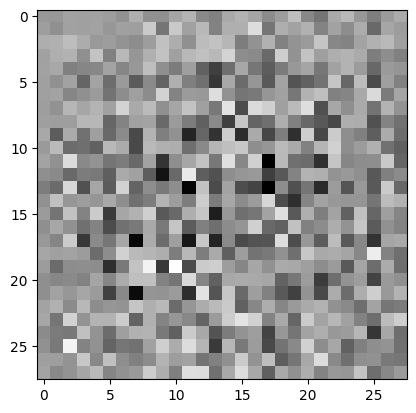

In [ ]:
#teste do gerador
plt.imshow(imagem_gerada[0,:,:,0], cmap='gray');

#como a rede ainda nao foi treinada, é apenas um bando de numeros aleatórios

## Contruir Discriminador

In [ ]:
#recebe imagens alvo e imagens nao alvo
def cria_discriminador():
  network = tf.keras.Sequential()

  #14x14x64
  network.add(layers.Conv2D(64, (5,5), strides=(2,2), padding='same', input_shape=[28,28,1]))
  network.add(layers.LeakyReLU())
  network.add(layers.Dropout(0.3))

  #7x7x128
  network.add(layers.Conv2D(128, (5,5), strides=(2,2), padding='same'))
  network.add(layers.LeakyReLU())
  network.add(layers.Dropout(0.3))

  #flattening
  network.add(layers.Flatten())
  network.add(layers.Dense(1)) # 1 neuronio de saida
  #sem função de ativação, será aplicada mais a frente.
  #trabalhando com os dados brutos da rede na saida (logits)

  network.summary()

  return network

In [ ]:
discriminador = cria_discriminador()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 14, 14, 64)        1664      
                                                                 
 leaky_re_lu_11 (LeakyReLU)  (None, 14, 14, 64)        0         
                                                                 
 dropout_2 (Dropout)         (None, 14, 14, 64)        0         
                                                                 
 conv2d_3 (Conv2D)           (None, 7, 7, 128)         204928    
                                                                 
 leaky_re_lu_12 (LeakyReLU)  (None, 7, 7, 128)         0         
                                                                 
 dropout_3 (Dropout)         (None, 7, 7, 128)         0         
                                                                 
 flatten_1 (Flatten)         (None, 6272)             

In [ ]:
discriminador.input

<KerasTensor: shape=(None, 28, 28, 1) dtype=float32 (created by layer 'conv2d_2_input')>

In [ ]:
discriminador(imagem_gerada, training=False) # sao feitos calculos

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.00389398]], dtype=float32)>

## Calculo do Erro para os 2 componentes

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def discriminador_loss(expected_output, fake_output): #expected são as imagens alvo e fake são as imagens criadas pelo gerador
  real_loss = cross_entropy(tf.ones_like(expected_output), expected_output) #preenche com o valor 1, pois sao as esperadas
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output) #preenhce com valor 0, pois sao as imagens geradas
  total_loss = real_loss + fake_loss
  return total_loss

In [ ]:
def gerador_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
#otimizador para cada uma das redes
gerador_otimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001)
discriminador_otimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001)

## Treinamento

In [ ]:
epocas = 100
dimensao_ruido = 100
numero_imagens = 16

In [ ]:
@tf.function
def treinamento(imagens):
  ruido = tf.random.normal([batch_size, dimensao_ruido])
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape: #gradiente para cada componente
    imagens_geradas = gerador(ruido, training=True) #imanges aleatorias

    expected_output = discriminador(imagens, training=True)

    fake_output = discriminador(imagens_geradas, training=True)#essas imagens entao sao enviadas ao discriminador e ele dirá se sao ou nao imanges alvo

    gen_loss = gerador_loss(fake_output)
    disc_loss = discriminador_loss(expected_output, fake_output)

  gradients_gerador = gen_tape.gradient(gen_loss, gerador.trainable_variables) #pesos que serao att
  gradients_discriminador = disc_tape.gradient(disc_loss, discriminador.trainable_variables) #pesos que serao att
  #as duas linhas de codigo acima indica a direção dos pesos

  gerador_otimizer.apply_gradients(zip(gradients_gerador, gerador.trainable_variables))
  discriminador_otimizer.apply_gradients(zip(gradients_discriminador, discriminador.trainable_variables))

In [ ]:
imagens_teste = tf.random.normal([numero_imagens, dimensao_ruido])
imagens_teste.shape

TensorShape([16, 100])

In [ ]:
def treina_gan(dataset, epocas, imagens_teste):
  for epoch in range(epocas):
    for imagem_batch in dataset:
      #print(imagem_batch.shape)
      treinamento(imagem_batch)
    print(f'Epoca {epoch+1}')
    imagens_geradas = gerador(imagens_teste, training=False)

    plt.figure(figsize=(10,10))
    for i in range(imagens_geradas.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(imagens_geradas[i,:,:,0] * 127.5 + 127.5, cmap='gray')
      plt.axis('off')
    plt.show()

Epoca 1


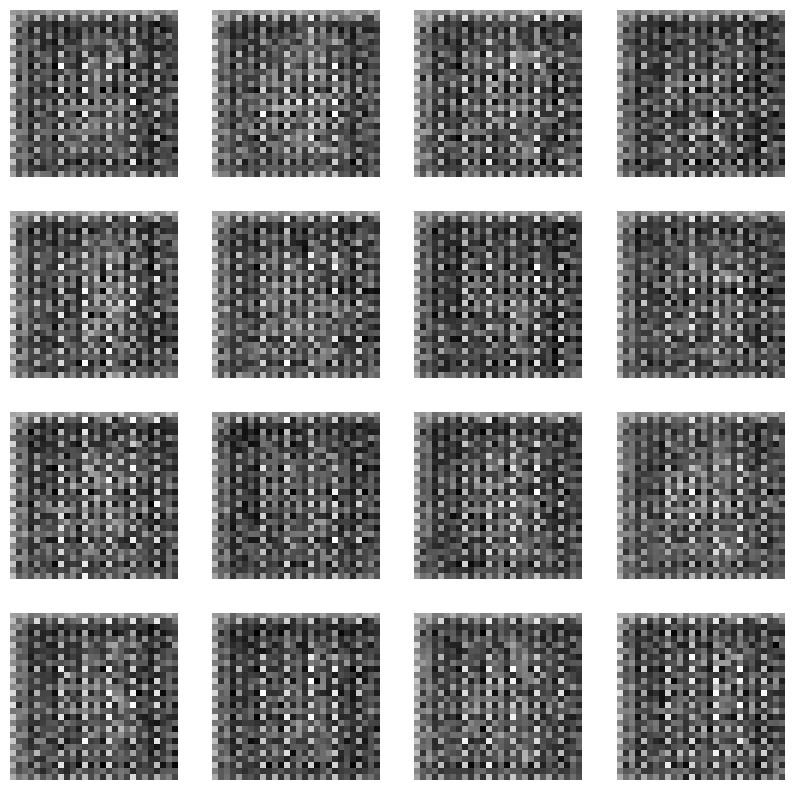

Epoca 2


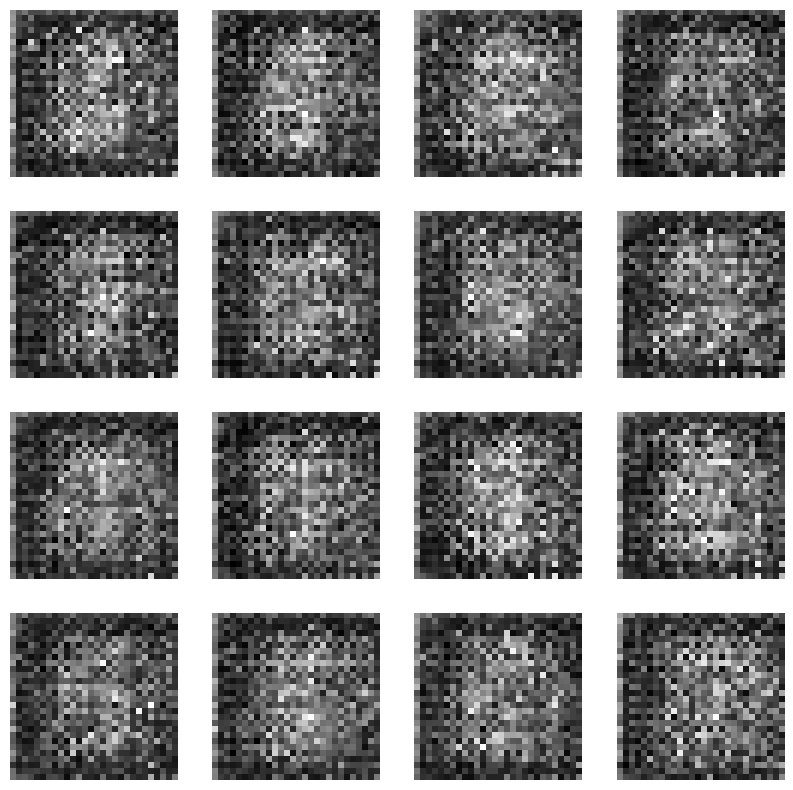

Epoca 3


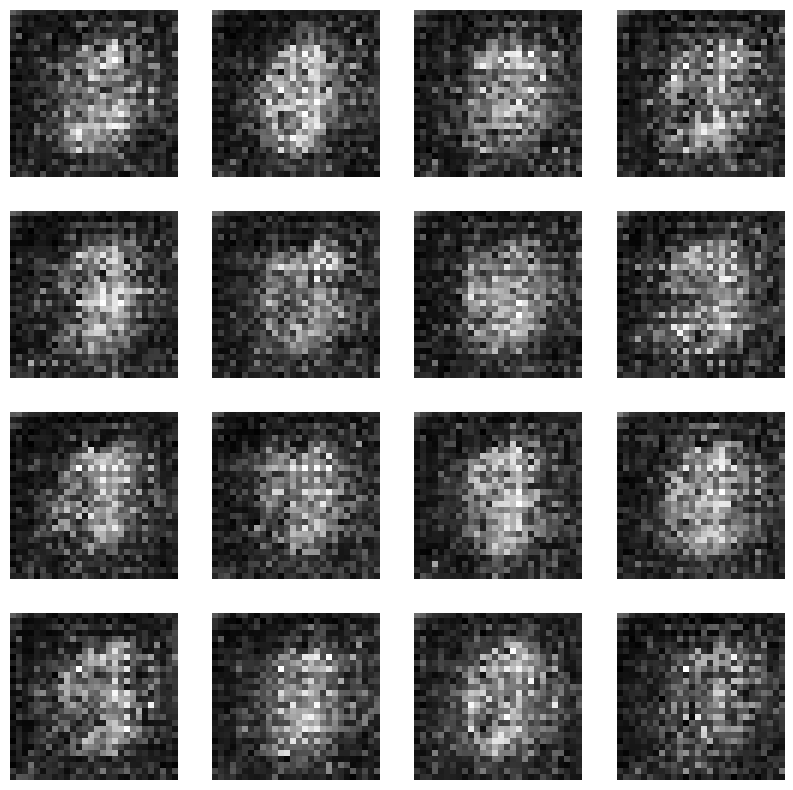

Epoca 4


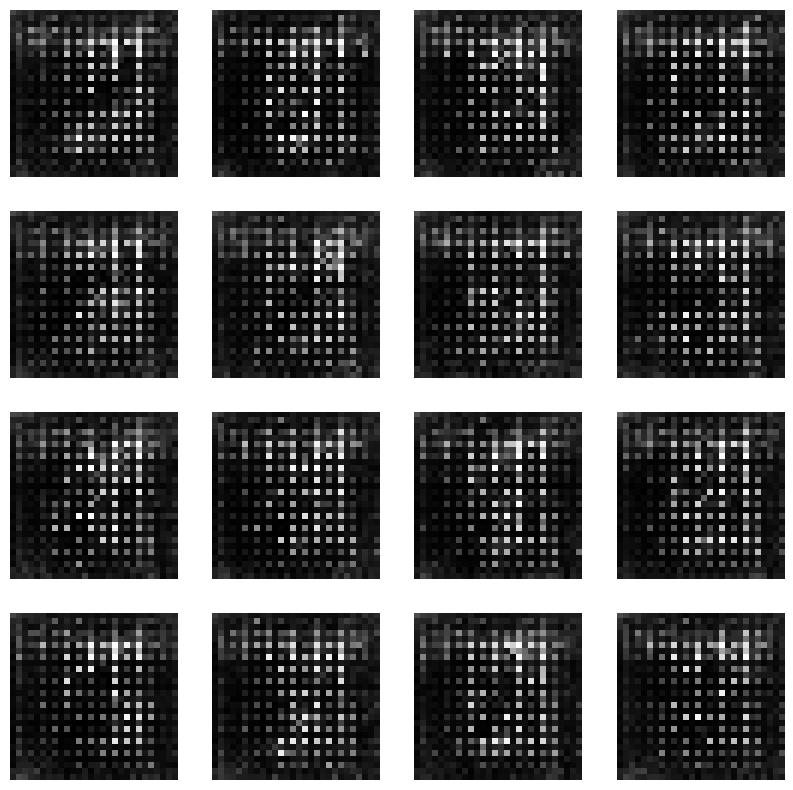

Epoca 5


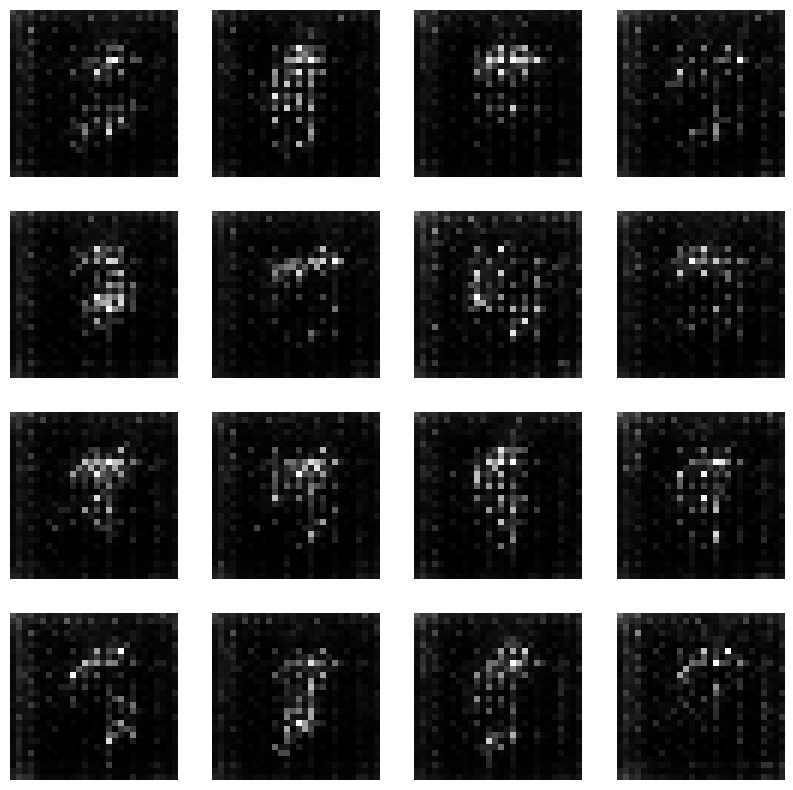

KeyboardInterrupt: 

In [ ]:
treina_gan(X_train, epocas, imagens_teste)

# Projeto 20 - Segmentação

> a segmentação é acessar o bounding box detectado e extrair apenas os pixels que estão relacionados ao objeto.

> existem dois tipos, por instância e semântica.

> 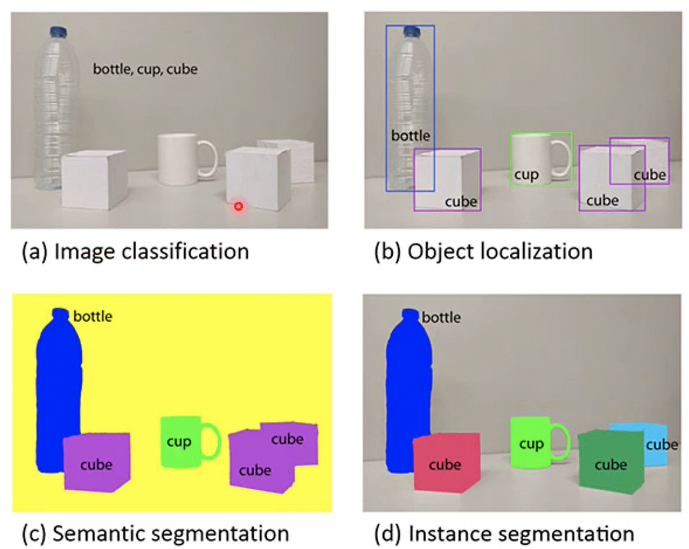

> na semantica os objetos da mesam classe sao tratados da mesma forma.

> ja na instância cada objeto é tratado diferentemente.

> Mask R-CNN é uma das arquiteturas mais eficientes e fáceis de ser implementada.

> Ela permite tanto a detectação quanto a segmentação, podendo fazer um ou outro ou entao os dois.

> Após as camadas de convoluções, há camadas que buscam remover o fundo da imagem.



## Download da arquitetura

In [1]:
!git clone https://github.com/alsombra/Mask_RCNN-TF2/

Cloning into 'Mask_RCNN-TF2'...
remote: Enumerating objects: 1004, done.
remote: Total 1004 (delta 0), reused 0 (delta 0), pack-reused 1004
Receiving objects: 100% (1004/1004), 137.72 MiB | 15.13 MiB/s, done.
Resolving deltas: 100% (588/588), done.
Updating files: 100% (76/76), done.


In [2]:
!mv Mask_RCNN-TF2 Mask_RCNN #renomear o repositorio

In [3]:
#acessar o diretório
%cd Mask_RCNN/

/content/Mask_RCNN


In [4]:
pwd #confirmação

'/content/Mask_RCNN'

In [5]:
# compilação e configuração da rede
!pip install -r requirements.txt
!python setup.py install

  Using cached jedi-0.19.1-py2.py3-none-any.whl.metadata (22 kB)
Using cached jedi-0.19.1-py2.py3-none-any.whl (1.6 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.9/83.9 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 8.4 MB/s eta 0:00:00
/content/Mask_RCNN/setup.py:9: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources
/usr/local/lib/python3.10/dist-packages/setuptools/dist.py:458: SetuptoolsDeprecationWarning: Invalid dash-separated options
!!

        ********************************************************************************
        Usage of dash-separated 'description-file' will not be supported in future
        versions. Please use the underscore name 'description_file' instead.

        By 

In [6]:
# voltar ao diretório original
%cd ..

/content


In [7]:
pwd #confirmação

'/content'

In [7]:
!pip install numpy==1.23 #downgrade pro conta do curso
#tem que reiniciar o ambiente

  Using cached numpy-1.23.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.2 kB)
Using cached numpy-1.23.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.0 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xgboost 2.1.0 requires nvidia-nccl-cu12; platform_system == "Linux" and platform_machine != "aarch64", which is not installed.
albucore 0.0.12 requires numpy<2,>=1.24.4, but you have numpy 1.23.0 which is incompatible.
albumentations 1.4.12 requires numpy>=1.24.4, but you have numpy 1.23.0 which is incompatible.
chex 0.1.86 requires numpy>=1.24.1, but you have numpy 1.23.0 which is incompatible.
pandas-stubs 2.1.4.231227 requires numpy>=1.26.0; python_version < "3.13", 

In [ ]:
#downgrades necessários para mexer com a MaskCNN
!pip install tensorflow==1.15.2
!pip install tensorflow-gpu==1.15.0
!pip install q keras==2.1.0

In [8]:
import os
import sys
import cv2
import numpy as np
import skimage.io
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import tensorflow as tf

In [9]:
ROOT_DIR = os.path.abspath('./Mask_RCNN')
ROOT_DIR #caminho da pasta

'/content/Mask_RCNN'

In [10]:
sys.path

['/content',
 '/env/python',
 '/usr/lib/python310.zip',
 '/usr/lib/python3.10',
 '/usr/lib/python3.10/lib-dynload',
 '',
 '/usr/local/lib/python3.10/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.10/dist-packages/IPython/extensions',
 '/usr/local/lib/python3.10/dist-packages/setuptools/_vendor',
 '/root/.ipython']

In [11]:
#adicionar o diretorio da Mask dentro dos paths
sys.path.append(ROOT_DIR)

In [12]:
sys.path

['/content',
 '/env/python',
 '/usr/lib/python310.zip',
 '/usr/lib/python3.10',
 '/usr/lib/python3.10/lib-dynload',
 '',
 '/usr/local/lib/python3.10/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.10/dist-packages/IPython/extensions',
 '/usr/local/lib/python3.10/dist-packages/setuptools/_vendor',
 '/root/.ipython',
 '/content/Mask_RCNN']

In [13]:
#!pip install --upgrade mrcnn
from mrcnn import utils
from mrcnn import visualize
import mrcnn.model as modellib

In [14]:
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/')) #unir o diretório raiz com uma nova pasta
#coco é uma base de dados que contem imagens para detecção de objetos

In [15]:
sys.path

['/content',
 '/env/python',
 '/usr/lib/python310.zip',
 '/usr/lib/python3.10',
 '/usr/lib/python3.10/lib-dynload',
 '',
 '/usr/local/lib/python3.10/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.10/dist-packages/IPython/extensions',
 '/usr/local/lib/python3.10/dist-packages/setuptools/_vendor',
 '/root/.ipython',
 '/content/Mask_RCNN',
 '/',
 '/content/Mask_RCNN/samples/coco/']

In [16]:
import coco

In [17]:
MODEL_DIR = os.path.join(ROOT_DIR, 'logs') #nova pasta no diretório
IMAGE_DIR = os.path.join(ROOT_DIR, 'images')

In [18]:
MODEL_DIR, IMAGE_DIR

('/content/Mask_RCNN/logs', '/content/Mask_RCNN/images')

## Carregar a rede

In [19]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

In [20]:
COCO_MODEL_PATH = os.path.join(ROOT_DIR, 'mask_rcnn_coco.h5') #pesos da rede
COCO_MODEL_PATH

'/content/Mask_RCNN/mask_rcnn_coco.h5'

> Apenas criou as pastas, agora tem que fazer o download desses arquivos e colocar nas pastas certas.

In [21]:
utils.download_trained_weights(COCO_MODEL_PATH) #baixar os pesos

... done downloading pretrained model!


In [22]:
class InferenceConfig(coco.CocoConfig): #classe para inferencia
    GPU_COUNT = 1 #para trabalhar com GPU
    IMAGES_PER_GPU = 1 #similar ao batch size, por isso 1, afinal nao estou treinando nada

In [23]:
config = InferenceConfig()

In [24]:
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [25]:
rn = modellib.MaskRCNN(mode='inference', #criar a rede neural em mode de previsao
                       model_dir=MODEL_DIR, #pasta onde será os logs da rede
                       config=config)

In [26]:
COCO_MODEL_PATH

'/content/Mask_RCNN/mask_rcnn_coco.h5'

In [ ]:
#rn.save(MODEL_DIR, save_format='tf')

rn.load_weights(COCO_MODEL_PATH, by_name=True)

## Detecação de objetos

In [ ]:
#lista de objetos que podem ser detectados
#BG = backgkround
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

In [ ]:
len(class_names)

81

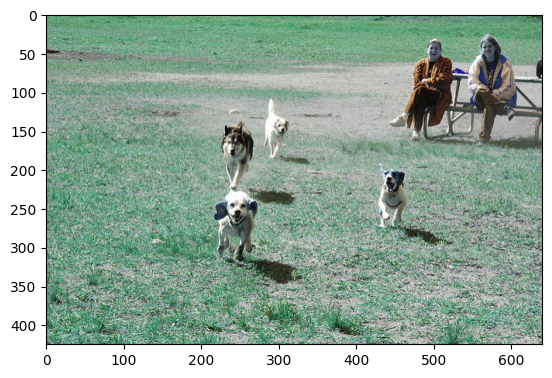

In [ ]:
imagem = cv2.imread('/content/Mask_RCNN/images/2516944023_d00345997d_z.jpg')
plt.imshow(imagem); # pelo cv2 a leitura é no BGR

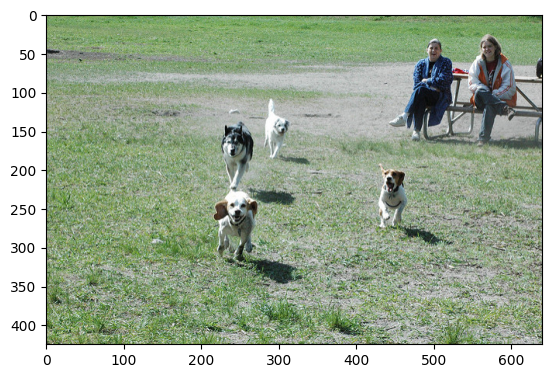

In [ ]:
imagem = skimage.io.imread('/content/Mask_RCNN/images/2516944023_d00345997d_z.jpg')
plt.imshow(imagem); # # pelo skimage a leitura é no RGB

#usaremos essa biblioteca pois nao será preciso ficar fazendo transformação do tipo da imagem

In [ ]:
resultados = rn.detect([imagem], verbose=0)
resultados

#em class_ids há as classes que foram detectadas
# masks indica as mascaras que são retornadas, indicando o objeto e o fundo do objeto. False o pixel é fundo da imagem e True o pixel faz parte do objeto
# rois são as regiões de interesse, ou seja, onde estão os bounding box, sendo X, Y, W, L
# scores é a confiança para cada objeto

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[{'rois': array([[195, 426, 277, 467],
         [226, 216, 321, 273],
         [106, 280, 189, 314],
         [ 32, 445, 159, 527],
         [136, 225, 231, 268],
         [ 27, 541, 168, 607],
         [ 75, 476, 164, 634]], dtype=int32),
  'class_ids': array([17, 17, 17,  1, 17,  1, 14], dtype=int32),
  'scores': array([0.9997004 , 0.9996582 , 0.9996049 , 0.99913245, 0.99799263,
         0.997436  , 0.9165011 ], dtype=float32),
  'masks': array([[[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          ...,
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False]],
  
         [[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
       

In [ ]:
class_names[17], class_names[1], class_names[14]

('dog', 'person', 'bench')

In [ ]:
r = resultados[0]

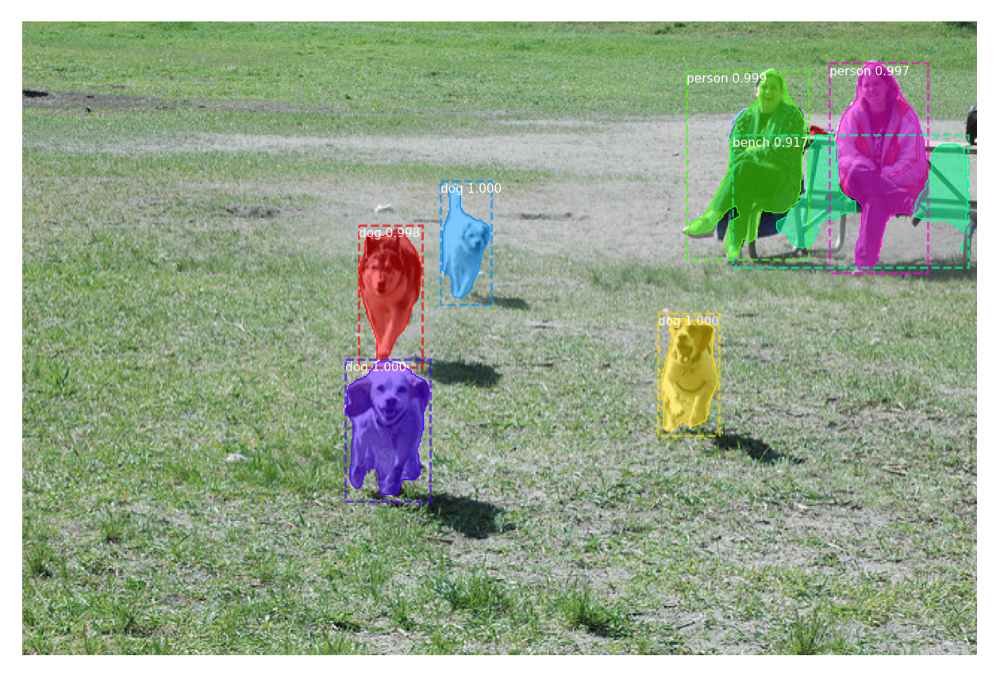

In [ ]:
visualize.display_instances(imagem, r['rois'], r['masks'],
                            r['class_ids'], class_names, r['scores']) #função para vizualizar os resultados na imagem

## Remoção do fundo da imagem

In [ ]:
np.unique(r['masks'], return_counts=True) #contagem de pixels False e True para a foto, muito mais background do que objetos detectados

(array([False,  True]), array([1881592,   22408]))

In [ ]:
r['masks']

array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, Fal

In [ ]:
def segmentar(imagem, r, indice): #função para pegar apenas os valores True
  mask = r['masks'][:,:,indice] #indice da imagem
  #print(mask)
  #print(mask.shape)

  mask = np.stack((mask,) * 3, axis = -1) #add uma nova dimensão na estrutura da mascara, canal de cores
  #print(mask)
  #print(mask.shape)

  mask = mask.astype('uint8') #converter True e False para 0 e 1 respectivamente
  #print(mask)
  #print(mask.min(), mask.max())

  bg = 255 - mask * 255 #pintar o fundo de branco
  #print(bg)
  #print(bg.min(), bg.max())

  mask_show = np.invert(bg) #pintar o fundo de preto 255 vira 0
  #print(mask_show)

  mask_img = imagem * mask #multiplicar todos os pixels pela mascara
  #print(mask_img)

  result = mask_img + bg
  return result, mask_show

In [ ]:
segmentacao, mask_obj = segmentar(imagem, r, 0)

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
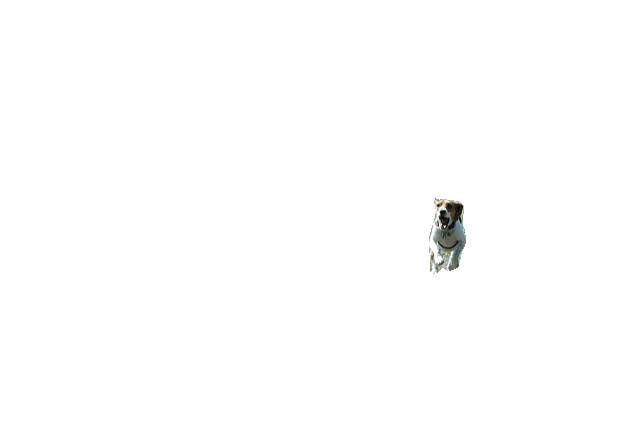

In [ ]:
segmentacao #apenas o objeto

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)
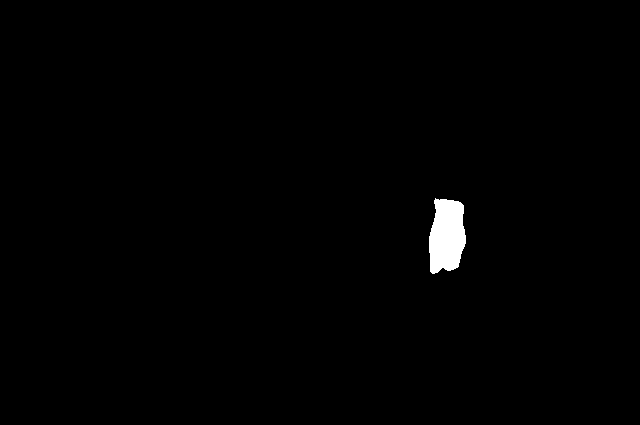

In [ ]:
mask_obj #apenas a mascara

In [ ]:
def mostra_segmentacao(imagem, r, indice, show_mask = False): #concatenar os dois tipos de imagens geradas, detecção e máscara
  segmentacao, mask_obj = segmentar(imagem, r, indice)
  plt.subplots(1, figsize=(16,16))
  plt.axis('off')
  if show_mask == True:
    plt.imshow(np.concatenate([mask_obj, segmentacao], axis = 1))
  else:
    plt.imshow(np.concatenate([imagem, segmentacao], axis = 1))

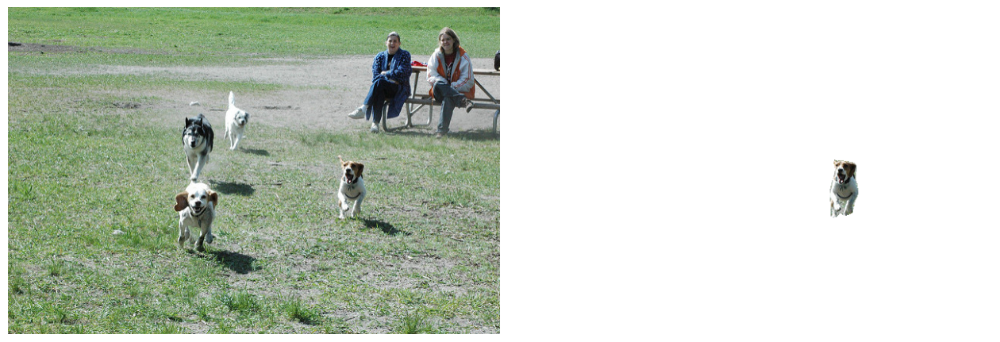

In [ ]:
mostra_segmentacao(imagem, r, 0, False)

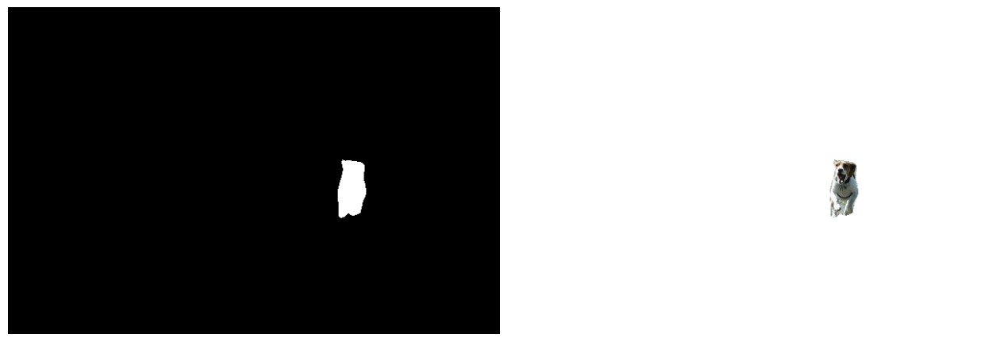

In [ ]:
mostra_segmentacao(imagem, r, 0, True)

In [ ]:
r['rois'], len(r['rois']) #todos os objetos detectados

(array([[195, 426, 277, 467],
        [226, 216, 321, 273],
        [106, 280, 189, 314],
        [ 32, 445, 159, 527],
        [136, 225, 231, 268],
        [ 27, 541, 168, 607],
        [ 75, 476, 164, 634]], dtype=int32),
 7)

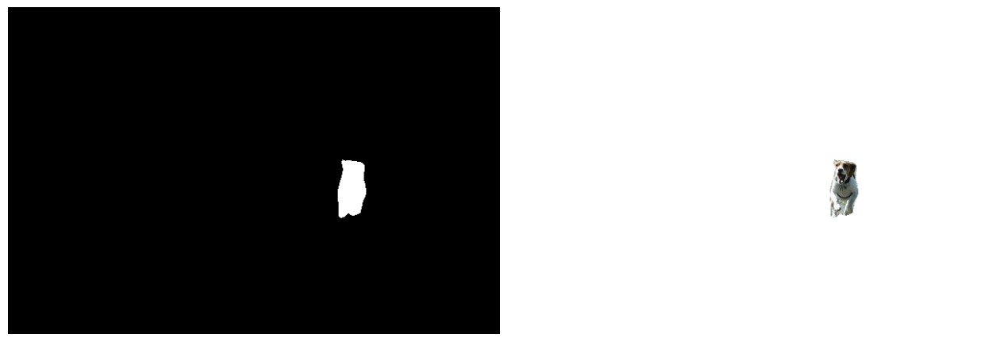

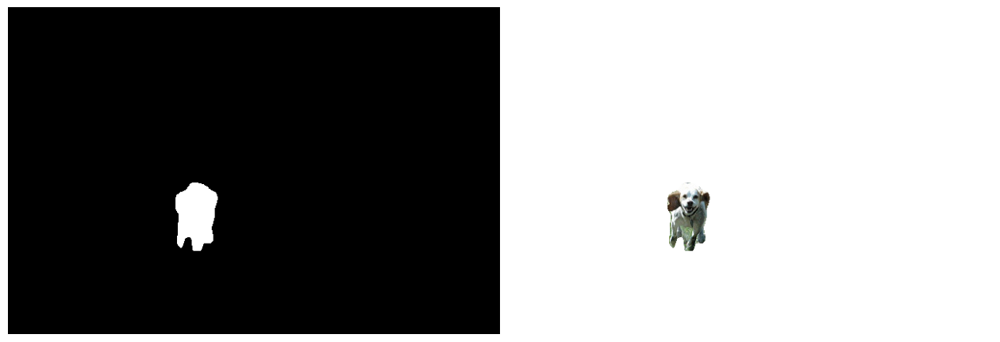

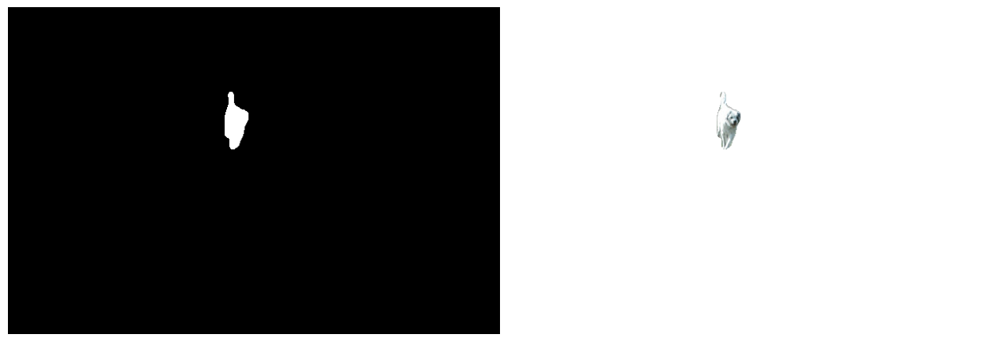

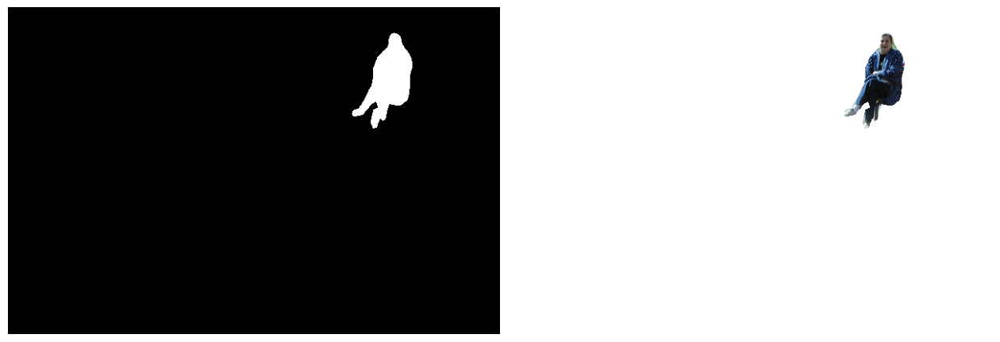

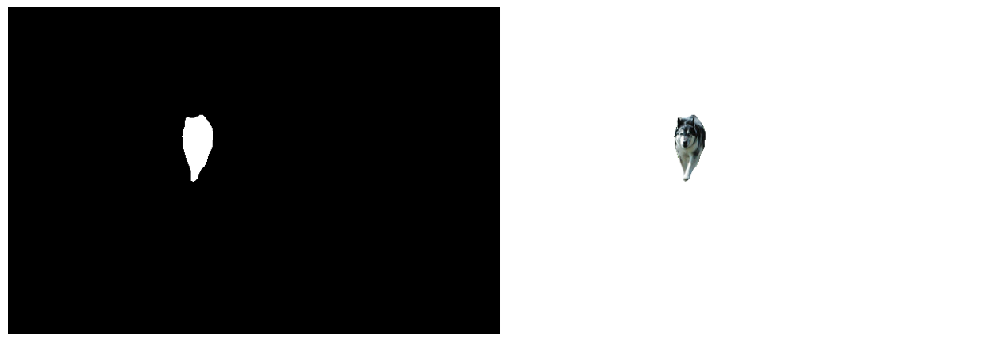

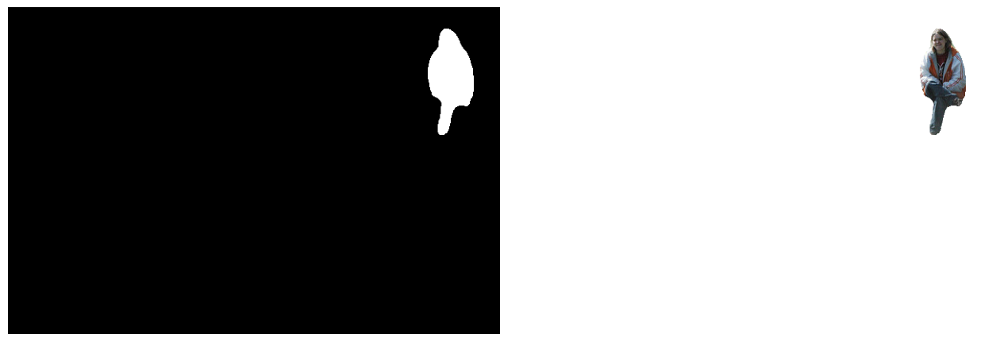

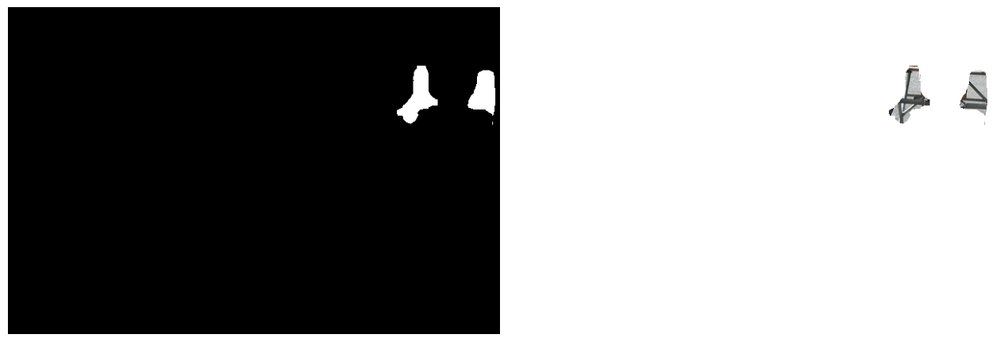

In [ ]:
for indice in range(len(r['rois'])):
  #print(indice)
  mostra_segmentacao(imagem, r, indice, True)



---


                                                                         FIM

---

